In [1]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import matplotlib
import telecontrol_parser as tp
import timeseries_functions as tf
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import modelling as mdl
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.linear_model import *
from sklearn.neural_network import *
from sklearn.ensemble import *
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn import tree
import sklearn
from sklearn.experimental import enable_hist_gradient_boosting
import tkinter
import plotly
import statsmodels.api as sma
from importlib import reload
import tensorflow
import keras

root = tkinter.Tk()
my_dpi = root.winfo_fpixels('1i')

In [2]:
MLdb = mdl.MLdata('../data_sets/feats/')
MLdb.load_datasets()
MLdb.set_dataset(2,features=('lobith_feats','gemaal_feats','knmi_feats','waterstanden_feats'))
# MLdb.set_dataset(2,features=tuple())


In [3]:

# MLdb.combine_datasets()
# print(MLdb.datadict[list(MLdb.datadict.keys())[2]])
# print(MLdb.datadict['ALL'])
# print(MLdb.get_datasets())
print(len(MLdb.dataset.columns))
MLdb.clean_columns()
print(len(MLdb.dataset.columns))
MLdb.drop_na()
print(len(MLdb.dataset.columns))
MLdb.create_train_test_split(0.8)

# MLdb.linear_regression()
MLdb.scale_data(mode = 'y',scaler = 'minmax')
y_pred_naive = MLdb.naive_predictive()
# MLdb.dataset
# MLdb.vif_threshold = 20

852
847
847


In [4]:
# epochs = 16
# batch_size = 255
# model  = keras.models.Sequential()
# learning_rate = 0.001

In [5]:
# dataset_train = keras.preprocessing.timeseries.timeseries_dataset_from_array(
#     MLdb.train_x,
#     MLdb.train_y_scaled,
#     sequence_length = 6*12,
#     batch_size = batch_size
# )

In [6]:
# dataset_val = keras.preprocessing.timeseries.timeseries_dataset_from_array(
#     MLdb.test_x,
#     MLdb.test_y_scaled,
#     sequence_length = 6*12,
#     batch_size = batch_size
# )

In [7]:
# for batch in dataset_train.take(1):
#     inputs, targets = batch
# print(inputs.numpy().shape)
# print(targets.numpy().shape)

In [8]:
# inputs = keras.layers.Input(shape=(inputs.shape[1],inputs.shape[2]))
# lstm_out = keras.layers.LSTM(32)(inputs)
# outputs = keras.layers.Dense(1)(lstm_out)

# model = keras.Model(inputs=inputs, outputs=outputs)
# model.compile(optimizer=tensorflow.keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
# model.summary()

In [9]:
# path_checkpoint = "model_checkpoint.h5"
# es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

# modelckpt_callback = keras.callbacks.ModelCheckpoint(
#     monitor="val_loss",
#     filepath=path_checkpoint,
#     verbose=1,
#     save_weights_only=True,
#     save_best_only=True,
# )

# history = model.fit(
#     dataset_train,
#     epochs=epochs,
#     validation_data=dataset_val,
#     callbacks=[es_callback, modelckpt_callback],
# )

In [10]:
# def visualize_loss(history, title):
#     loss = history.history["loss"]
#     val_loss = history.history["val_loss"]
#     epochs = range(len(loss))
#     plt.figure()
#     plt.plot(epochs, loss, "b", label="Training loss")
#     plt.plot(epochs, val_loss, "r", label="Validation loss")
#     plt.title(title)
#     plt.xlabel("Epochs")
#     plt.ylabel("Loss")
#     plt.legend()
#     plt.show()


# visualize_loss(history, "Training and Validation Loss")

In [11]:
# reshape input to be [samples, time steps, features]
trainX = np.reshape(np.array(MLdb.train_x), (MLdb.train_x.shape[0], 1, MLdb.train_x.shape[1]))
testX = np.reshape(np.array(MLdb.test_x), (MLdb.test_x.shape[0], 1, MLdb.test_x.shape[1]))


In [27]:
testX

array([[[0.35542169, 0.03604625, 0.15413534, ..., 0.71628664,
         0.21747126, 0.7534202 ]],

       [[0.35542169, 0.03587622, 0.15413534, ..., 0.71628664,
         0.13885057, 0.7534202 ]],

       [[0.35542169, 0.0359329 , 0.15413534, ..., 0.71628664,
         0.08091954, 0.73680782]],

       ...,

       [[0.4126506 , 0.03598957, 0.22932331, ..., 0.58175896,
         0.19954023, 0.58143322]],

       [[0.4126506 , 0.03672637, 0.22932331, ..., 0.58175896,
         0.22206897, 0.58143322]],

       [[0.4126506 , 0.03644298, 0.22932331, ..., 0.58175896,
         0.22804598, 0.57882736]]])

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [13]:
tensorflow.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [14]:


path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

In [30]:
look_back = 1
trainY = np.array(MLdb.train_y)
# create and fit the LSTM network
model = Sequential()
model.add(Dense(1024,input_shape=(None,testX.shape[2])))
model.add(Dense(1024))
model.add(Dense(1024))
model.add(Dense(1024))
model.add(Dense(216))
model.compile(loss='mean_squared_error', optimizer=tensorflow.keras.optimizers.Adam(
    learning_rate= 0.0001
))
# model.build(input_shape = (1,1,12))
model.summary()
history = model.fit(trainX, trainY, 
    epochs=20, 
    batch_size=128, 
    verbose=2,
    validation_data=(testX,np.array(MLdb.test_y)),
    callbacks=[es_callback, modelckpt_callback]
    )
def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()


visualize_loss(history, "Training and Validation Loss")

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_50 (Dense)             (None, None, 1024)        647168    
_________________________________________________________________
dense_51 (Dense)             (None, None, 1024)        1049600   
_________________________________________________________________
dense_52 (Dense)             (None, None, 1024)        1049600   
_________________________________________________________________
dense_53 (Dense)             (None, None, 1024)        1049600   
_________________________________________________________________
dense_54 (Dense)             (None, None, 216)         221400    
Total params: 4,017,368
Trainable params: 4,017,368
Non-trainable params: 0
_________________________________________________________________


InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.

In [ ]:
# # x = pd.concat([MLdb.train_x,MLdb.test_x])
# # x = x[~x.index.duplicated(keep='first')]
# x_train = MLdb.train_x
# cols = {}
# for col in x_train.columns:
#     cols[col] = (np.array(x_train[col]).reshape(len(x_train[col]),1))
# output_seq = cols.pop('EGV_OPP')
# cols = list(cols.values())
# dataset = np.hstack(cols)
# n_input = 216
# generator = keras.preprocessing.sequence.TimeseriesGenerator(dataset,output_seq,length=n_input,batch_size=128)

# x_test = MLdb.test_x
# cols_test = {}
# for col in x_test.columns:
#     cols_test[col] = (np.array(x_test[col]).reshape(len(x_test[col]),1))
# output_seq = cols_test.pop('EGV_OPP')
# cols_test = list(cols_test.values())
# dataset_test = np.hstack(cols_test)
# generator_test = keras.preprocessing.sequence.TimeseriesGenerator(dataset_test,output_seq,length=n_input,batch_size=128)



Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_23 (LSTM)               (None, 64)                19712     
_________________________________________________________________
dropout_18 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_21 (Dense)             (None, 216)               14040     
Total params: 33,752
Trainable params: 33,752
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10


c:\Users\Admin\Anaconda3\envs\py36_env\lib\site-packages\keras\engine\training.py:1972: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.



1681/1681 [==============================] - 30s 17ms/step - loss: 0.0136 - val_loss: 0.0024

Epoch 00001: val_loss improved from 0.74898 to 0.00242, saving model to model_checkpoint.h5
Epoch 2/10
1681/1681 [==============================] - 28s 17ms/step - loss: 0.0035 - val_loss: 0.0016

Epoch 00002: val_loss improved from 0.00242 to 0.00163, saving model to model_checkpoint.h5
Epoch 3/10
1681/1681 [==============================] - 28s 17ms/step - loss: 0.0025 - val_loss: 0.0011

Epoch 00003: val_loss improved from 0.00163 to 0.00113, saving model to model_checkpoint.h5
Epoch 4/10
1681/1681 [==============================] - 29s 17ms/step - loss: 0.0019 - val_loss: 7.9359e-04

Epoch 00004: val_loss improved from 0.00113 to 0.00079, saving model to model_checkpoint.h5
Epoch 5/10
1681/1681 [==============================] - 28s 17ms/step - loss: 0.0015 - val_loss: 6.6924e-04

Epoch 00005: val_loss improved from 0.00079 to 0.00067, saving model to model_checkpoint.h5
Epoch 6/10
1681/16

In [ ]:
# look_back = 6*36
# batch_size = 64
# dataset_x_train = MLdb.train_x
# dataset_x_test = MLdb.test_x
# dataset_y_train = MLdb.train_x['EGV_OPP']
# dataset_y_test = MLdb.test_x['EGV_OPP']


# train_data_gen = keras.preprocessing.sequence.TimeseriesGenerator(
#     dataset_x_train,dataset_y_train,
#     length = look_back,
#     sampling_rate = 1,
#     stride = 1,
#     batch_size = batch_size
# )
# test_data_gen = keras.preprocessing.sequence.TimeseriesGenerator(
#     dataset_x_test,dataset_y_test,
#     length = look_back,
#     sampling_rate = 1,
#     stride = 1,
#     batch_size = batch_size
# )

# # for i in range(len(train_data_gen)):
# #     x_, y_ = train_data_gen[i]
# #     print(x_.shape,y_.shape)


In [ ]:
# model = Sequential()
# model.add(tensorflow.keras.layers.LSTM(64, input_shape=(look_back, 12)))
# model.add(tensorflow.keras.layers.Dropout(0.2))
# model.add(Dense(216))
# model.compile(loss='mean_squared_error', optimizer=tensorflow.keras.optimizers.Adam(
#     learning_rate= 0.0001
# ))
# # model.build(input_shape = (1,1,12))
# model.summary()
# history = model.fit_generator(train_data_gen,
#     callbacks=[es_callback, modelckpt_callback],
#     epochs = 10,
#     validation_data=test_data_gen)

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_30 (LSTM)               (None, 64)                19712     
_________________________________________________________________
dropout_24 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_27 (Dense)             (None, 216)               14040     
Total params: 33,752
Trainable params: 33,752
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10


c:\Users\Admin\Anaconda3\envs\py36_env\lib\site-packages\keras\engine\training.py:1972: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.



3362/3362 [==============================] - 49s 14ms/step - loss: 0.0065 - val_loss: 6.7854e-04

Epoch 00001: val_loss did not improve from 0.00041
Epoch 2/10
3362/3362 [==============================] - 47s 14ms/step - loss: 0.0012 - val_loss: 2.8662e-04

Epoch 00002: val_loss improved from 0.00041 to 0.00029, saving model to model_checkpoint.h5
Epoch 3/10
3362/3362 [==============================] - 48s 14ms/step - loss: 6.8499e-04 - val_loss: 2.1061e-04

Epoch 00003: val_loss improved from 0.00029 to 0.00021, saving model to model_checkpoint.h5
Epoch 4/10
3362/3362 [==============================] - 47s 14ms/step - loss: 4.8386e-04 - val_loss: 1.4699e-04

Epoch 00004: val_loss improved from 0.00021 to 0.00015, saving model to model_checkpoint.h5
Epoch 5/10
3362/3362 [==============================] - 48s 14ms/step - loss: 3.8215e-04 - val_loss: 1.2563e-04

Epoch 00005: val_loss improved from 0.00015 to 0.00013, saving model to model_checkpoint.h5
Epoch 6/10
3362/3362 [=============

In [ ]:
# model = Sequential()
# model.add(tensorflow.keras.layers.LSTM(64, input_shape=(n_input, 12)))
# model.add(tensorflow.keras.layers.Dropout(0.2))
# model.add(Dense(216))
# model.compile(loss='mean_squared_error', optimizer=tensorflow.keras.optimizers.Adam(
#     learning_rate= 0.0001
# ))
# # model.build(input_shape = (1,1,12))
# model.summary()
# history = model.fit_generator(generator,
#     validation_data=generator_test,
#     callbacks=[es_callback, modelckpt_callback],
#     epochs = 10)

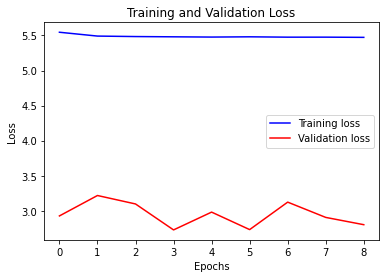

In [25]:
def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure()
    plt.plot(epochs, loss, "b", label="Training loss")
    plt.plot(epochs, val_loss, "r", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()


visualize_loss(history, "Training and Validation Loss")

In [326]:
y_pred = pd.DataFrame(model.predict(np.reshape(np.array(MLdb.test_x),(MLdb.test_x.shape[0],1,12))))


In [196]:
# y_pred = pd.DataFrame(MLdb.scaler.inverse_transform(pd.DataFrame(model.predict(test_data_gen))))
# # y_pred = model.predict(MLdb.test_x)
# horizon = 6*36
# scale = 0.75
# testset = MLdb.test_y.iloc[216:]
# testset
# plot = plt.figure(figsize=(scale*1920/my_dpi, scale*1080/my_dpi))
# plt.plot(testset.iloc[:,horizon-1],label = 'true')
# plt.plot(testset.index,y_pred.iloc[:,horizon-1], label = 'prediction')
# plt.legend(fontsize = 'xx-large',loc = 'lower right')
# plt.title('Model op t + '+str(horizon))
# # plt.ylim(0,20)

# plotly.tools.mpl_to_plotly(plot)

c:\Users\Admin\Anaconda3\envs\py36_env\lib\site-packages\plotly\matplotlylib\renderer.py:612: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



In [210]:
# y_pred_train = pd.DataFrame(MLdb.scaler.inverse_transform(pd.DataFrame(model.predict(train_data_gen))))
# y_pred_train


,0,1,2,3,4,5,6,7,8,9,...,206,207,208,209,210,211,212,213,214,215
0,3.712085,3.706878,3.713574,3.708307,3.714453,3.720122,3.710012,3.723067,3.715898,3.697659,...,3.717690,3.708547,3.706953,3.718629,3.711826,3.710316,3.715031,3.724251,3.707232,3.708010
1,4.681605,4.671776,4.682920,4.670938,4.683496,4.695561,4.676763,4.695217,4.687119,4.662477,...,4.679092,4.673109,4.675379,4.694366,4.684508,4.682693,4.688365,4.697748,4.678288,4.666728
2,5.394097,5.385540,5.400610,5.387151,5.397102,5.406723,5.391323,5.405418,5.399693,5.381532,...,5.392660,5.388743,5.393268,5.408996,5.398099,5.395571,5.400302,5.407575,5.397523,5.383800
3,5.932732,5.929063,5.945100,5.934443,5.938478,5.943258,5.934343,5.941405,5.938601,5.931132,...,5.934708,5.932841,5.938648,5.948978,5.938841,5.936646,5.938853,5.941827,5.944425,5.930645
4,6.258477,6.259712,6.274658,6.268771,6.265731,6.265166,6.264305,6.265804,6.263830,6.266493,...,6.265593,6.263722,6.270104,6.274312,6.267066,6.264904,6.263847,6.263406,6.277490,6.265253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215101,0.808217,0.806619,0.808590,0.803959,0.807314,0.805462,0.801945,0.809135,0.809210,0.798375,...,0.807487,0.807613,0.806568,0.809903,0.805717,0.804621,0.804613,0.810146,0.807275,0.810357
215102,0.819152,0.817583,0.819493,0.814666,0.817792,0.815536,0.813277,0.821132,0.819750,0.809489,...,0.819074,0.818560,0.818854,0.820640,0.817321,0.815956,0.815225,0.821813,0.819451,0.822122
215103,0.817366,0.816629,0.818142,0.813295,0.815932,0.813297,0.812413,0.820369,0.817960,0.808990,...,0.818024,0.817029,0.818601,0.818869,0.816661,0.814950,0.813412,0.820573,0.818933,0.821216
215104,0.812002,0.812361,0.813325,0.808476,0.810682,0.807862,0.808083,0.815873,0.812780,0.805272,...,0.813262,0.811960,0.814599,0.813532,0.812479,0.810471,0.808214,0.815639,0.814503,0.816395


(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215106,)
(53615,)
(215106,)
(53615,)
(53615,)
(215

<Figure size 432x288 with 0 Axes>

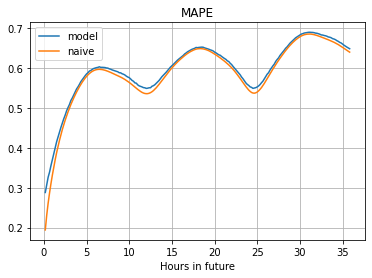

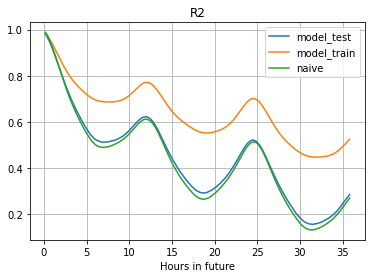

<Figure size 432x288 with 0 Axes>

In [224]:
# mape_list = []
# R2_list = []
# R2_train_list = []
# mape_list_naive = []
# R2_list_naive = []

# # y_pred_train = model.predict(MLdb.train_x)
# # y_pred_train = pd.DataFrame(model.predict(np.reshape(np.array(MLdb.train_x),(MLdb.train_x.shape[0],1,MLdb.train_x.shape[1]))))


# for i in range(0,MLdb.test_y.shape[1]-1):
#     test_y = MLdb.test_y.iloc[216:,i].values
#     print(test_y.shape)
#     train_y = MLdb.train_y.iloc[216:,i].values
#     print(train_y.shape)
#     pred_y = y_pred.iloc[:,i]
#     print(pred_y.shape)

#     pred_y_train = y_pred_train.iloc[:,1]
#     print(pred_y_train.shape)
#     pred_y_naive = y_pred_naive.iloc[216:,i]
#     print(pred_y_naive.shape)

#     mape_list.append(mape(test_y,pred_y)**(1/2))
#     R2_list.append(r2_score(test_y,pred_y))
#     mape_list_naive.append(mape(test_y,pred_y_naive)**(1/2))
#     R2_list_naive.append(r2_score(test_y,pred_y_naive))
#     R2_train_list.append(r2_score(train_y,pred_y_train))

# R2_list = np.array(R2_list).clip(min=0)


# x_bereik = [(i*10+10)/60 for i in range(len(R2_list))]
# plt.plot(x_bereik,mape_list,label = 'model')
# plt.plot(x_bereik,mape_list_naive,label = 'naive')
# plt.title('MAPE')
# plt.xlabel('Hours in future')
# plt.legend()
# plt.grid()
# plt.figure()
# plt.plot(x_bereik,R2_list,label = 'model_test')
# plt.plot(x_bereik,R2_train_list,label ='model_train')
# plt.plot(x_bereik,R2_list_naive, label = 'naive')
# plt.title('R2')
# plt.xlabel('Hours in future')
# plt.legend()
# plt.grid()
# plt.figure()

<AxesSubplot:>

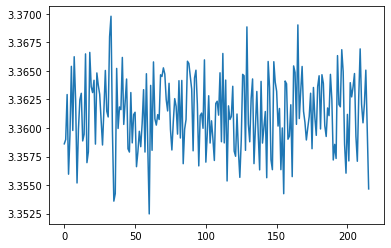

In [309]:
# startdate = MLdb.get_random_date('train')

# MLdb.test_y[startdate-pd.Timedelta(days=2):startdate+pd.Timedelta(days=2):]
# abc = MLdb.train_y.iloc[216:,].copy()
# y_pred_train.loc[startdate].plot()

In [192]:
# y_pred = pd.DataFrame(MLdb.scaler.inverse_transform(model.predict_generator(generator_test)))


EGV_OPP_(t+1)      0.753
EGV_OPP_(t+2)      0.756
EGV_OPP_(t+3)      0.753
EGV_OPP_(t+4)      0.744
EGV_OPP_(t+5)      0.740
                   ...  
EGV_OPP_(t+212)    0.744
EGV_OPP_(t+213)    0.723
EGV_OPP_(t+214)    0.733
EGV_OPP_(t+215)    0.733
EGV_OPP_(t+216)    0.737
Name: 2022-02-09 07:50:00, Length: 216, dtype: float64

In [316]:
# y_pred = model.predict(MLdb.test_x)
horizon = 6*36
scale = 0.75
plot = plt.figure(figsize=(scale*1920/my_dpi, scale*1080/my_dpi))
plt.plot(MLdb.test_y.iloc[:,horizon-1],label = 'true')
plt.plot(MLdb.test_y.index,y_pred.iloc[:,horizon-1], label = 'prediction')
plt.legend(fontsize = 'xx-large',loc = 'lower right')
plt.title('Model op t + '+str(horizon))
# plt.ylim(0,20)

plotly.tools.mpl_to_plotly(plot)

c:\Users\Admin\Anaconda3\envs\py36_env\lib\site-packages\plotly\matplotlylib\renderer.py:612: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



In [317]:
naive = MLdb.naive_predictive()

<Figure size 432x288 with 0 Axes>

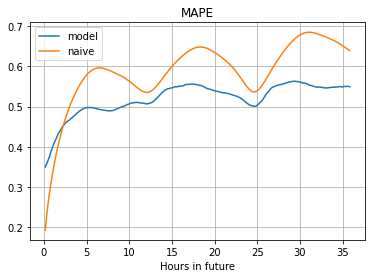

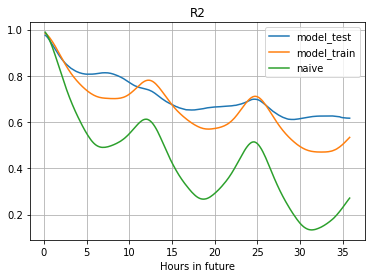

<Figure size 432x288 with 0 Axes>

In [327]:
mape_list = []
R2_list = []
R2_train_list = []
mape_list_naive = []
R2_list_naive = []

# y_pred_train = model.predict(MLdb.train_x)
y_pred_train = pd.DataFrame(model.predict(np.reshape(np.array(MLdb.train_x),(MLdb.train_x.shape[0],1,MLdb.train_x.shape[1]))))
# y_pred_train = pd.DataFrame(MLdb.scaler.inverse_transform(pd.DataFrame(model.predict(train_data_gen))))


for i in range(0,MLdb.test_y.shape[1]-1):
    test_y = MLdb.test_y.iloc[:,i].values
    train_y = MLdb.train_y.iloc[:,i].values
    pred_y = y_pred.iloc[:,i]
    pred_y_train = y_pred_train.iloc[:,1]
    pred_y_naive = y_pred_naive.iloc[:,i]
    mape_list.append(mape(test_y,pred_y)**(1/2))
    R2_list.append(r2_score(test_y,pred_y))
    mape_list_naive.append(mape(test_y,pred_y_naive)**(1/2))
    R2_list_naive.append(r2_score(test_y,pred_y_naive))
    R2_train_list.append(r2_score(train_y,pred_y_train))

R2_list = np.array(R2_list).clip(min=0)


x_bereik = [(i*10+10)/60 for i in range(len(R2_list))]
plt.plot(x_bereik,mape_list,label = 'model')
plt.plot(x_bereik,mape_list_naive,label = 'naive')
plt.title('MAPE')
plt.xlabel('Hours in future')
plt.legend()
plt.grid()
plt.figure()
plt.plot(x_bereik,R2_list,label = 'model_test')
plt.plot(x_bereik,R2_train_list,label ='model_train')
plt.plot(x_bereik,R2_list_naive, label = 'naive')
plt.title('R2')
plt.xlabel('Hours in future')
plt.legend()
plt.grid()
plt.figure()


In [198]:
y_pred_train

,0,1,2,3,4,5,6,7,8,9,...,206,207,208,209,210,211,212,213,214,215
0,3.712085,3.706878,3.713574,3.708307,3.714453,3.720122,3.710012,3.723067,3.715898,3.697659,...,3.717690,3.708547,3.706953,3.718629,3.711826,3.710316,3.715031,3.724251,3.707232,3.708010
1,4.681605,4.671776,4.682920,4.670938,4.683496,4.695561,4.676763,4.695217,4.687119,4.662477,...,4.679092,4.673109,4.675379,4.694366,4.684508,4.682693,4.688365,4.697748,4.678288,4.666728
2,5.394097,5.385540,5.400610,5.387151,5.397102,5.406723,5.391323,5.405418,5.399693,5.381532,...,5.392660,5.388743,5.393268,5.408996,5.398099,5.395571,5.400302,5.407575,5.397523,5.383800
3,5.932732,5.929063,5.945100,5.934443,5.938478,5.943258,5.934343,5.941405,5.938601,5.931132,...,5.934708,5.932841,5.938648,5.948978,5.938841,5.936646,5.938853,5.941827,5.944425,5.930645
4,6.258477,6.259712,6.274658,6.268771,6.265731,6.265166,6.264305,6.265804,6.263830,6.266493,...,6.265593,6.263722,6.270104,6.274312,6.267066,6.264904,6.263847,6.263406,6.277490,6.265253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215101,0.808217,0.806619,0.808590,0.803959,0.807314,0.805462,0.801945,0.809135,0.809210,0.798375,...,0.807487,0.807613,0.806568,0.809903,0.805717,0.804621,0.804613,0.810146,0.807275,0.810357
215102,0.819152,0.817583,0.819493,0.814666,0.817792,0.815536,0.813277,0.821132,0.819750,0.809489,...,0.819074,0.818560,0.818854,0.820640,0.817321,0.815956,0.815225,0.821813,0.819451,0.822122
215103,0.817366,0.816629,0.818142,0.813295,0.815932,0.813297,0.812413,0.820369,0.817960,0.808990,...,0.818024,0.817029,0.818601,0.818869,0.816661,0.814950,0.813412,0.820573,0.818933,0.821216
215104,0.812002,0.812361,0.813325,0.808476,0.810682,0.807862,0.808083,0.815873,0.812780,0.805272,...,0.813262,0.811960,0.814599,0.813532,0.812479,0.810471,0.808214,0.815639,0.814503,0.816395


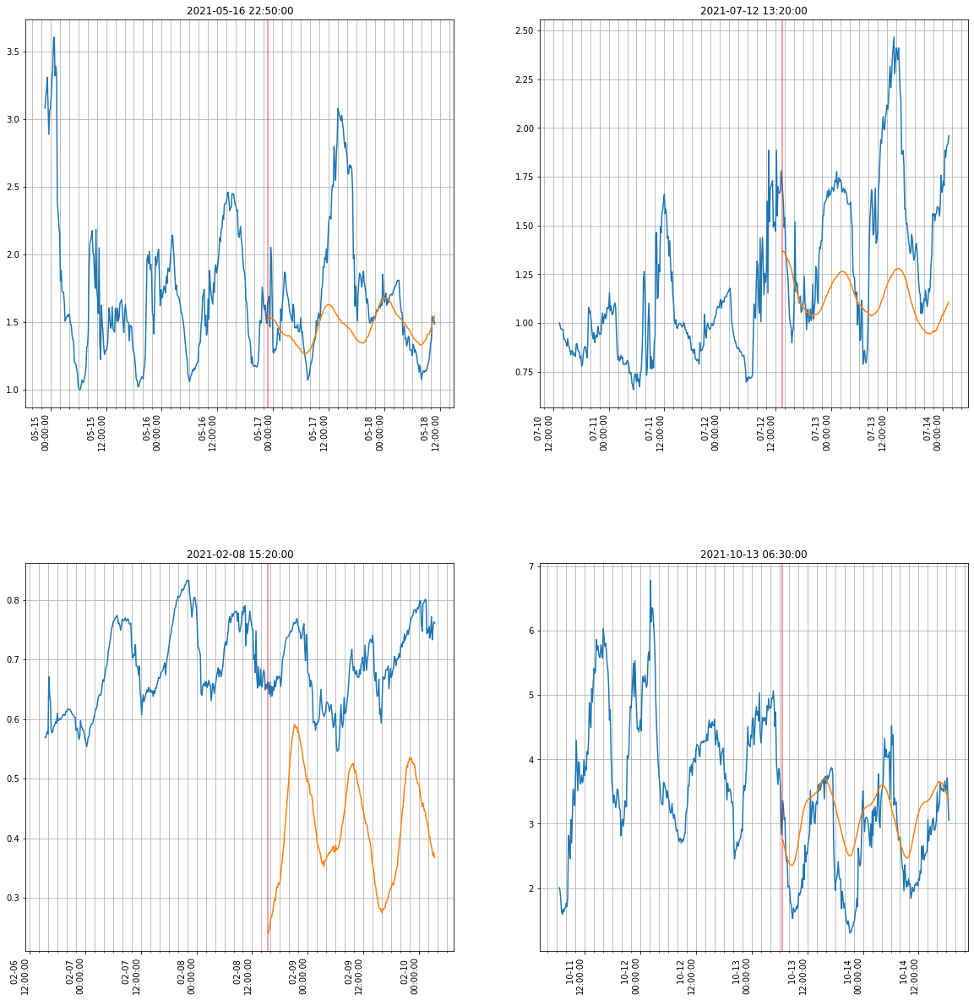

In [330]:
rows = 2
cols = 2
yscale = 1
xscale = 2

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(yscale*1920/my_dpi, xscale*1080/my_dpi))

for row in range(rows):
    for col in range(cols):
        startdate = MLdb.get_random_date('test')
        comp = MLdb.predict_window(past = 2,startdate = startdate,model = model)
        plot = comp.plot(ax = ax[row,col], legend = False,x_compat = True)

        plot.set(xlabel=None)
        # plot.xaxis.get_ticklocs(minor=True)
        plot.set_title(str(startdate))
        # plot.minorticks_on()
        plot.xaxis.set_minor_locator(ticker.AutoMinorLocator(6))
        plot.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%d \n%H:%M:%S'))


        plot.tick_params(axis='x',labelsize = 10,labelrotation= 90)
        plot.grid(which = 'both')
        plot.axvline(startdate,color = 'red',alpha = 0.5)

plt.subplots_adjust(hspace=0.4)
plt.show()
